In [1]:
import numpy as np
import matplotlib.pyplot as plt
from bitalg.tests.test3 import Test
from bitalg.visualizer.main import Visualizer
from os.path import isfile
from IPython.display import display
from time import time

# Zadawanie wielokąta przy pomocy myszki

<h2>Funkcje do obsługi wielokątów</h2>

In [2]:
# Save polygon to file
# each line contains a point - two floats seperated with a space representing x and y coordinates in that order
def savePolygonToFile(polygon, path):
    file = open(path, "w")
    for point in polygon:
        file.write(f"{point[0]} {point[1]}\n")
    file.close()

# Read polygon from file
def readPolygonFromFile(path):
    if not isfile(path):
        print(f"File {path} not found")
        return None
    file = open(path, "r")
    polygon = []
    for line in file:
        point = [float(x) for x in line.split()]
        polygon.append(tuple(point))
    return polygon

# Generate polygon with a mouse
# makes use of the "%matplotlib ipympl" magic
def generatePolygon():
    # Setup plot
    polygon = []
    plt.close("all")
    fig, ax = plt.subplots()
    ax.set_title("LMB - dodaj punkt, RMB - zakończ")
    connectionId = None

    # Add point to canvas
    def addPoint(point):
        ax.scatter(point[0], point[1], color="blue")

    # Add edge to canvas
    def addEdge(point1, point2):
        xs = [point1[0], point2[0]]
        ys = [point1[1], point2[1]]
        ax.plot(xs, ys, color="blue")
    
    # Mouse click event handler
    def onClick(event):
        # LMB - add point
        if event.button == 1 and event.inaxes == ax:
            point = (event.xdata, event.ydata)
            # Add new point and new edge to the canvas
            addPoint(point)
            if len(polygon) >= 1:
                addEdge(polygon[-1], point)
            # Append new point to the polygon and draw it on canvas
            polygon.append(point)
            plt.draw()
        # RMB - end polygon creation
        elif event.button == 3 and len(polygon) >= 3:
            # Add edge between first and last point
            addEdge(polygon[0], polygon[-1])
            plt.draw()
            ax.set_title("Stworzono wielokąt")
            # Sever the connection
            fig.canvas.mpl_disconnect(connectionId)

    # Connect plot to the event handler
    connectionId = fig.canvas.mpl_connect('button_press_event', onClick)
    plt.xlim(0, 20)
    plt.ylim(0, 20)
    plt.show()
    return polygon

# Draw polygon
def drawPolygon(polygon):
    canvas = Visualizer()
    canvas.add_polygon(polygon, fill=False)
    canvas.add_point(polygon)
    canvas.show()

# Convert point to string
def pointToString(point, decimalPlaces=3):
    stringFormat = f"{{:.{decimalPlaces}f}}"
    return f"({stringFormat.format(point[0])},{stringFormat.format(point[1])})"

# Convert points array to a string of points
def pointsToString(points, decimalPlaces=3):
    result = ""
    for point in points:
        result += f"{pointToString(point, decimalPlaces)}, "
    return result[:-2]

# Print polygon
def printPolygon(polygon):
    print(f"Wielokąt - {len(polygon)} wierzchołków")
    print(pointsToString(polygon))

<h2>Generacja własnego wielokąta oraz jego wizualizacja i zapis do pliku</h2>

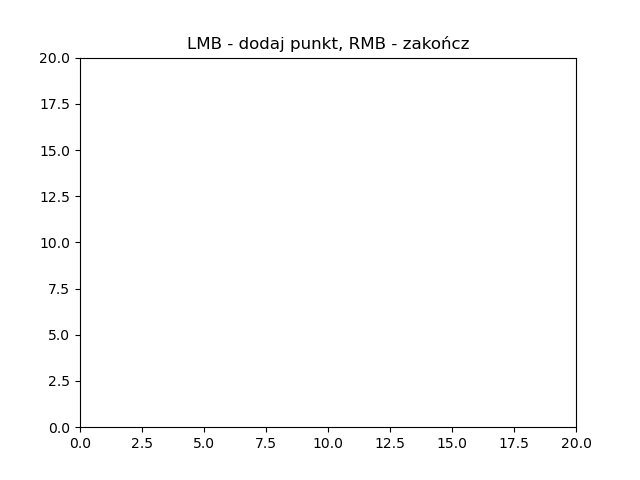

In [3]:
%matplotlib ipympl
generatedPolygon = generatePolygon()

Wielokąt - 17 wierzchołków
(10.040,1.446), (17.097,8.534), (18.387,10.807), (18.629,13.892), (17.702,17.355), (16.290,18.437), (13.589,18.924), (11.734,18.058), (10.484,15.785), (10.081,14.270), (9.556,15.244), (8.831,17.409), (7.016,18.653), (3.347,18.924), (2.581,16.868), (1.895,13.567), (2.661,10.537)


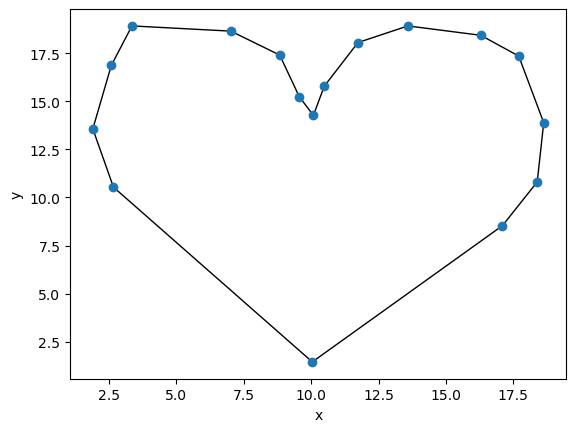

In [4]:
%matplotlib inline
savePolygonToFile(generatedPolygon, "generatedPolygon")
printPolygon(generatedPolygon)
drawPolygon(generatedPolygon)

<h2>Przykładowe wielokąty do testów</h2>

1)

Wielokąt - 24 wierzchołków
(9.395,13.665), (7.944,19.239), (5.968,15.451), (2.460,18.156), (1.935,12.420), (3.710,14.910), (7.339,12.637), (4.194,9.390), (3.387,3.329), (7.581,8.578), (8.105,3.925), (5.685,2.626), (8.952,1.436), (9.637,7.388), (13.508,6.143), (15.847,1.436), (18.508,3.438), (15.484,11.446), (12.097,9.769), (12.621,14.693), (16.331,14.477), (15.645,18.860), (11.653,19.184), (11.129,15.721)


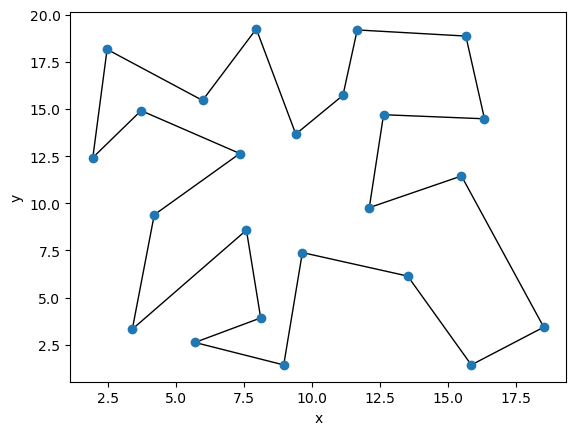

In [5]:
%matplotlib inline
polygon1 = readPolygonFromFile("polygons/polygon1")
printPolygon(polygon1)
drawPolygon(polygon1)

2)

Wielokąt - 20 wierzchołków
(8.952,4.899), (12.258,2.410), (13.911,4.790), (10.484,6.414), (12.298,9.715), (14.919,7.388), (15.847,4.682), (14.476,2.734), (10.887,1.436), (7.258,5.656), (5.444,10.851), (2.742,9.661), (3.387,4.628), (8.145,0.678), (10.887,0.191), (16.290,1.165), (18.105,6.684), (16.331,13.611), (10.403,17.020), (7.661,14.855)


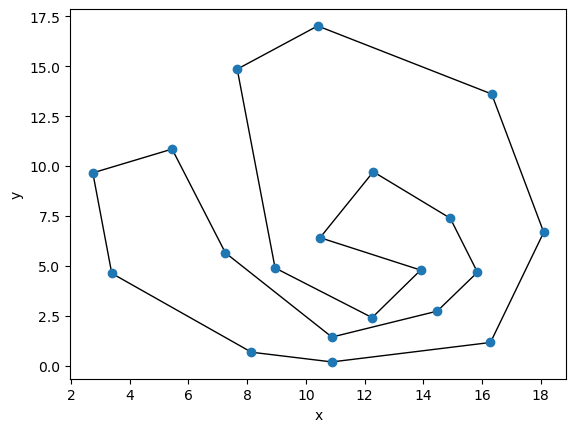

In [6]:
%matplotlib inline
polygon2 = readPolygonFromFile("polygons/polygon2")
printPolygon(polygon2)
drawPolygon(polygon2)

3)

Wielokąt - 8 wierzchołków
(0.250,0.147), (0.849,0.136), (0.839,0.363), (0.583,0.377), (0.583,0.609), (0.853,0.626), (0.841,0.858), (0.216,0.847)


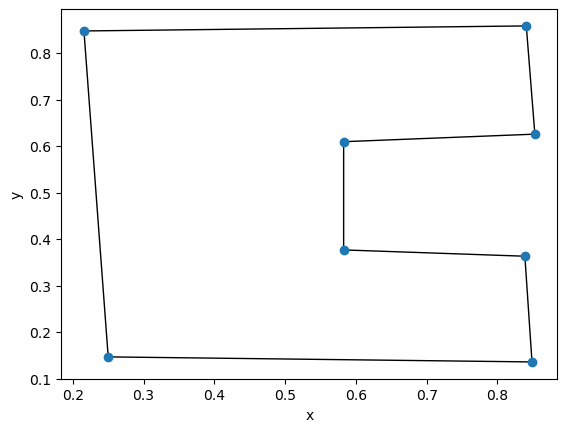

In [7]:
%matplotlib inline
polygon3 = readPolygonFromFile("polygons/polygon3")
printPolygon(polygon3)
drawPolygon(polygon3)

# Sprawdzanie y-monotoniczności wielokąta

<h2>Funkcje do sprawdzania y-monotoniczności</h2>

In [8]:
# Chain classification constants
LEFT = 1
RIGHT = -1

# Point class
class Point:
    def __init__(self, x, y, index, chain):
        self.x = x
        self.y = y
        self.index = index
        self.chain = chain

    def point(self):
        return (self.x, self.y)

# Finds the index of the highest and lowest point
def findLowestAndHighestPoints(polygon):
    yMin = yMax = polygon[0][1]
    indexMin = indexMax = 0
    for i, point in enumerate(polygon):
        y = point[1]
        if y < yMin:
            yMin = y
            indexMin = i
        elif y > yMax:
            yMax = y
            indexMax = i
    return indexMin, indexMax

# Seperates the polygon into left and right side - create chains for both side in order from the highest point to the lowest one
# left side contains the highest point of the polygon, right side conrains the lowest point of the polygon
def seperatePolygon(polygon):
    n = len(polygon)
    indexMin, indexMax = findLowestAndHighestPoints(polygon)
    # Find the length of each chain
    leftAmount = rightAmount = 0
    if indexMin < indexMax:
        leftAmount = indexMin + n - indexMax
        rightAmount = indexMax - indexMin
    else:
        leftAmount = indexMin - indexMax
        rightAmount = indexMax + n - indexMin

    # Create both chains
    leftChain = []
    rightChain = []
    for i in range(indexMax, indexMax+leftAmount):
        point = polygon[i%n]
        leftChain.append(Point(point[0], point[1], i%n, LEFT))
    for i in range(indexMin+rightAmount-1, indexMin-1, -1):
        point = polygon[i%n]
        rightChain.append(Point(point[0], point[1], i%n, RIGHT))

    return leftChain, rightChain

# Check if the polygon is y-monotonic
def yMonotonic(polygon):
    leftChain, rightChain = seperatePolygon(polygon)
    for i in range(len(leftChain)-1):
        if leftChain[i].y < leftChain[i+1].y:
            return False
    for i in range(len(rightChain)-1):
        if rightChain[i].y < rightChain[i+1].y:
            return False
    return True

<h2>Sprawdzenie czy podane wielokąty są y-monotoniczne</h2>

Wielokąt wygenerowany

In [9]:
print(yMonotonic(generatedPolygon))

False


Wielokąt testowy 1

In [10]:
print(yMonotonic(polygon1))

False


Wielokąt testowy 2

In [11]:
print(yMonotonic(polygon2))

False


Wielokąt testowy 3

In [12]:
print(yMonotonic(polygon3))

True


# Podział wierzchołków w zależności od ich typu

Podzielimy wierzchołki w zależności od ich typu:
<ul>
    <li style="color:green">początkowy<span style="color:black"> - wierzchołek, którego obaj sąsiedzi leżą poniżej i jego kąt wewnętrzny < $\pi$</span></li>
    <li style="color:red">końcowy<span style="color:black"> - wierzchołek, którego obaj sąsiedzi leżą powyżej i jego kąt wewnętrzny < $\pi$</span></li>
    <li style="color:blue">łączący<span style="color:black"> - wierzchołek, którego obaj sąsiedzi leżą powyżej i jego kąt wewnętrzny > $\pi$</span></li>
    <li style="color:turquoise">dzielący<span style="color:black"> - wierzchołek, którego obaj sąsiedzi leżą poniżej i jego kąt wewnętrzny > $\pi$</span></li>
    <li>prawidłowy - wierzchołek nie spełniający żadnego z powyższych warunków (jeden sąsiad poniżej, jeden powyżej)</li>
</ul>

<h2>Funkcje do kategoryzowania wierzchołków wielokąta</h2>

In [13]:
# Types and colors of vertices
START = 0
END = 1
CONNECT = 2
DIVIDE = 3
CORRECT = 4
vertexTypeColors = ["green", "red", "blue", "turquoise", "black"]

# Determinant of a 2x2 matrix
def det(a, b, c):
    return (a[0] - c[0]) * (b[1] - c[1]) - (a[1] - c[1]) * (b[0] - c[0])

# Determine the type of a vertex
def categorizeVertex(prevPoint, currPoint, nextPoint):
    minPoint = min(prevPoint, nextPoint, currPoint, key=lambda point: point[1])
    maxPoint = max(prevPoint, nextPoint, currPoint, key=lambda point: point[1])
    if currPoint == maxPoint:
        if det(prevPoint, currPoint, nextPoint) > 0:
            return START
        else:
            return DIVIDE
    elif currPoint == minPoint:
        if det(prevPoint, currPoint, nextPoint) > 0:
            return END
        else:
            return CONNECT
    return CORRECT

# Determine the type of all vertices from a polygon
# returns an array of types of vertices
def categorizePolygonVertices(polygon):
    n = len(polygon)
    vertexTypes = []
    currPoint = polygon[-1]
    nextPoint = polygon[0]
    for i in range(1, n+1):
        prevPoint = currPoint
        currPoint = nextPoint
        nextPoint = polygon[i%n]
        vertexTypes.append(categorizeVertex(prevPoint, currPoint, nextPoint))
    return vertexTypes

# Draw a polygon with vertices colored depending on their type
def drawColoredPolygon(polygon, types):
    pointsByType = [[] for _ in range(5)]
    for i, point in enumerate(polygon):
        pointsByType[types[i]].append(point)
    canvas = Visualizer()
    canvas.add_polygon(polygon, fill=False)
    for i in range(5):
        canvas.add_point(pointsByType[i], color=vertexTypeColors[i])
    canvas.show()


<h2>Podział punktów danych wielokątów</h2>

Wielokąt wygenerowany

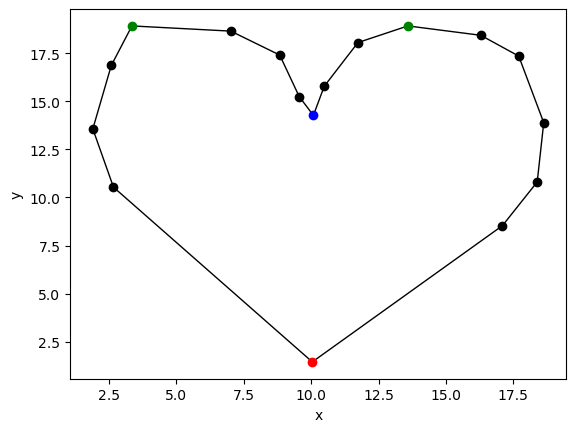

In [14]:
%matplotlib inline
drawColoredPolygon(generatedPolygon, categorizePolygonVertices(generatedPolygon))

Wielokąt testowy 1

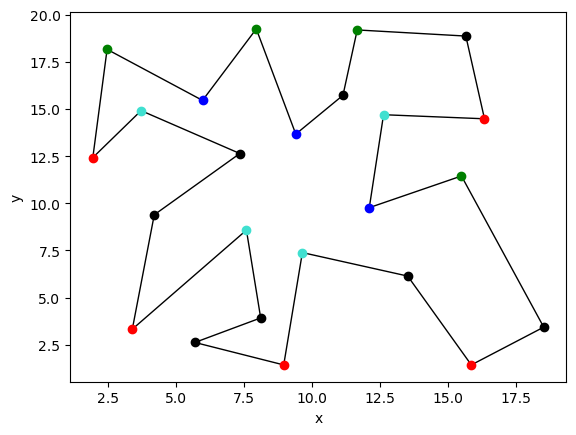

In [15]:
%matplotlib inline
drawColoredPolygon(polygon1, categorizePolygonVertices(polygon1))

Wielokąt testowy 2

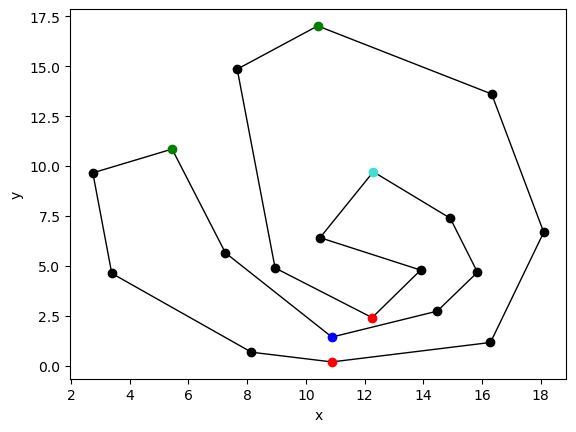

In [16]:
%matplotlib inline
drawColoredPolygon(polygon2, categorizePolygonVertices(polygon2))

Wielokąt testowy 3

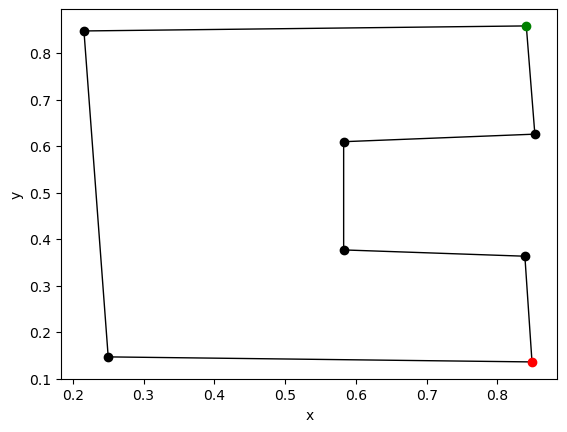

In [17]:
%matplotlib inline
drawColoredPolygon(polygon3, categorizePolygonVertices(polygon3))

# Podział wielokąta na wielokąty monotoniczne

<h2>Funkcje do podziału wielokąta na wielokąty monotoniczne</h2>

In [18]:
# Point class with information about index and type of vertex in polygon
class Point2:
    def __init__(self, x, y, index, pointType):
        self.x = x
        self.y = y
        self.index = index
        self.type = pointType
        self.edge1 = None # left/up
        self.edge2 = None # right/down

    def point(self):
        return (self.x, self.y)

# Returns an ordered list of points of polygon with respect to y coordinate
def getPointList(polygon):
    pointList = [None for _ in range(len(polygon))]
    vertexTypes = categorizePolygonVertices(polygon)
    for i, point in enumerate(polygon):
        pointList[i] = Point2(point[0], point[1], i, vertexTypes[i])
    return pointList

# Line segment class for the AVL tree
class LineSegment:
    def __init__(self, point1, point2):
        self.point1 = point1
        self.point2 = point2
        self.support = None
        if point1.x == point2.x:
            self.a = None
            self.b = point1.x
        else:
            self.a = (point1.y - point2.y) / (point1.x - point2.x)
            self.b = point1.y - self.a * point1.x

    def ls(self):
        return (self.point1.point(), self.point2.point())

    @staticmethod
    def updateBroomY(y):
        LineSegment.broomY = y

    def currentX(self):
        if self.a == None:
            return self.b
        if self.a == 0:
            return min(self.point1.x, self.point2.x)
        return (LineSegment.broomY - self.b) / self.a

    def __eq__(self,other):
        return self.point1 == other.point1 and self.point2 == other.point2
    
    def __lt__(self,other):
        return self.currentX() < other.currentX()

    def __hash__(self):
        return hash((self.point1, self.point2))

# Add edge pointer to a point
def addEdge(point, otherPoint, edge):
    if point.edge1 is None:
        point.edge1 = edge
    else:
        point.edge2 = edge
        otherOtherPoint = point.edge1.point1
        if otherOtherPoint.point() == point.point():
            otherOtherPoint = point.edge1.point2
        flag = False
        if point.type == CORRECT:
            flag = otherOtherPoint.y < otherPoint.y
        elif point.type == START or point.type == DIVIDE:
            flag = det(point.point(), otherOtherPoint.point(), otherPoint.point()) < 0
        else:
            flag = det(point.point(), otherOtherPoint.point(), otherPoint.point()) > 0
        if flag:
            point.edge1, point.edge2 = point.edge2, point.edge1
            
# Create and add pointers to edges in points
def addEdges(points):
    n = len(points)
    for i in range(n):
        p1 = points[i]
        p2 = points[(i+1)%n]
        ls = LineSegment(p1, p2)
        addEdge(p1, p2, ls)
        addEdge(p2, p1, ls)

# AVL tree for broom state structure
class AVLNode:
    def __init__(self, value):
        self.value = value
        self.left = None
        self.right = None
        self.height = 1

class AVLTree:
    def __init__(self):
        self.root = None

    def height(self, node):
        if not node:
            return 0
        return node.height

    def balance(self, node):
        if not node:
            return 0
        return self.height(node.left) - self.height(node.right)

    def insert(self, root, value):
        if not root:
            return AVLNode(value)
        elif value < root.value:
            root.left = self.insert(root.left, value)
        else:
            root.right = self.insert(root.right, value)
        root.height = 1 + max(self.height(root.left), self.height(root.right))
        balance = self.balance(root)
        # Left rotation
        if balance > 1 and value < root.left.value:
            return self.rightRotate(root)
        # Right rotation
        if balance < -1 and value > root.right.value:
            return self.leftRotate(root)
        # Left-Right rotation
        if balance > 1 and value > root.left.value:
            root.left = self.leftRotate(root.left)
            return self.rightRotate(root)
        # Right-Left rotation
        if balance < -1 and value < root.right.value:
            root.right = self.rightRotate(root.right)
            return self.leftRotate(root)
        return root

    def delete(self, root, value):
        if not root:
            return root
        if value < root.value:
            root.left = self.delete(root.left, value)
        elif value > root.value:
            root.right = self.delete(root.right, value)
        else:
            if not root.left:
                temp = root.right
                root = None
                return temp
            elif not root.right:
                temp = root.left
                root = None
                return temp
            temp = self.minValueNode(root.right)
            root.value = temp.value
            root.right = self.delete(root.right, temp.value)
        if not root:
            return root
        root.height = 1 + max(self.height(root.left), self.height(root.right))
        balance = self.balance(root)
        # Left rotation
        if balance > 1 and self.balance(root.left) >= 0:
            return self.rightRotate(root)
        # Right rotation
        if balance < -1 and self.balance(root.right) <= 0:
            return self.leftRotate(root)
        # Left-Right rotation
        if balance > 1 and self.balance(root.left) < 0:
            root.left = self.leftRotate(root.left)
            return self.rightRotate(root)
        # Right-Left rotation
        if balance < -1 and self.balance(root.right) > 0:
            root.right = self.rightRotate(root.right)
            return self.leftRotate(root)
        return root

    def leftRotate(self, z):
        y = z.right
        T2 = y.left
        y.left = z
        z.right = T2
        z.height = 1 + max(self.height(z.left), self.height(z.right))
        y.height = 1 + max(self.height(y.left), self.height(y.right))
        return y

    def rightRotate(self, z):
        y = z.left
        T3 = y.right
        y.right = z
        z.left = T3
        z.height = 1 + max(self.height(z.left), self.height(z.right))
        y.height = 1 + max(self.height(y.left), self.height(y.right))
        return y

    def minValueNode(self, root):
        current = root
        while current.left:
            current = current.left
        return current

    def search(self, root, value):
        if not root or root.value == value:
            return root
        if root.value < value:
            return self.search(root.right, value)
        return self.search(root.left, value)

    def insertValue(self, value):
        self.root = self.insert(self.root, value)

    def deleteValue(self, value):
        self.root = self.delete(self.root, value)

    def searchValue(self, value):
        return self.search(self.root, value)

    def findLeftEdge2(self, root, point):
        if not root:
            return None
        # search in right subtree
        if root.value.currentX() < point.x:
            rightVal = self.findLeftEdge2(root.right, point)
            if not rightVal:
                return root.value
            else:
                return rightVal
        # search in left subtree
        return self.findLeftEdge2(root.left, point)
    
    def findLeftEdge(self, point):
        return self.findLeftEdge2(self.root, point)

# Add diagonal
def addDiag(diagonals, point, edge):
    diagonals.append((point.index, edge.support.index))

# Get diagonals (as indices) that split polygon into monotone polygons
def getMonotoneSplitDiagonals(polygon):
    polygonPoints = getPointList(polygon)
    addEdges(polygonPoints)
    events = sorted(polygonPoints, key=lambda p: -p.y)
    state = AVLTree()
    diagonals = []

    for point in events:
        LineSegment.updateBroomY(point.y)
        if point.type == START:
            point.edge1.support = point
            state.insertValue(point.edge1)
        elif point.type == END:
            if point.edge1.support.type == CONNECT:
                addDiag(diagonals, point, point.edge1)
            state.deleteValue(point.edge1)
        elif point.type == DIVIDE:
            leftEdge = state.findLeftEdge(point)
            addDiag(diagonals, point, leftEdge)
            leftEdge.support = point
            point.edge2.support = point
            state.insertValue(point.edge2)
        elif point.type == CONNECT:
            if point.edge2.support.type == CONNECT:
                addDiag(diagonals, point, point.edge2)
            state.deleteValue(point.edge2)
            leftEdge = state.findLeftEdge(point)
            if leftEdge.support.type == CONNECT:
                addDiag(diagonals, point, leftEdge)
            leftEdge.support = point
        elif point.type == CORRECT:
            # inside on the right iff upper edge is in broom state
            # inside on the right
            if state.searchValue(point.edge1):
                if point.edge1.support.type == CONNECT:
                    addDiag(diagonals, point, point.edge1)
                state.deleteValue(point.edge1)
                point.edge2.support = point
                state.insertValue(point.edge2)
            # inside on the left
            else:
                leftEdge = state.findLeftEdge(point)
                if leftEdge.support.type == CONNECT:
                    addDiag(diagonals, point, leftEdge)
                leftEdge.support = point

    return diagonals

def drawAddedEdge(canvas, ls):
    canvas.add_line_segment(ls.ls(), color="green")

def drawRemovedEdge(canvas, ls):
    canvas.add_line_segment(ls.ls(), color="gray")

def drawAddedDiagonal(canvas, p1, p2):
    canvas.add_line_segment((p1.point(), p2.point()), color="purple")

# Get diagonals (as indices) that split polygon into monotone polygons with drawing the process
def getMonotoneSplitDiagonalsDraw(polygon):
    canvas = Visualizer()
    polygonPoints = getPointList(polygon)
    
    # Draw polygon with colored vertices
    pointsByType = [[] for _ in range(5)]
    for point in polygonPoints:
        pointsByType[point.type].append(point.point())
    canvas = Visualizer()
    canvas.add_polygon(polygon, fill=False)
    for i in range(5):
        canvas.add_point(pointsByType[i], color=vertexTypeColors[i])
    
    addEdges(polygonPoints)
    events = sorted(polygonPoints, key=lambda p: -p.y)
    state = AVLTree()
    diagonals = []
    broom = None

    for point in events:
        LineSegment.updateBroomY(point.y)
        
        # Draw broom
        if broom:
            canvas.remove_figure(broom)
        broom = canvas.add_line(((point.x, LineSegment.broomY), (point.x+0.01, LineSegment.broomY)), color="red")
        
        if point.type == START:
            point.edge1.support = point
            state.insertValue(point.edge1)
            drawAddedEdge(canvas, point.edge1)
        elif point.type == END:
            if point.edge1.support.type == CONNECT:
                addDiag(diagonals, point, point.edge1)
                drawAddedDiagonal(canvas, point, point.edge1.support)
            state.deleteValue(point.edge1)
            drawRemovedEdge(canvas, point.edge1)
        elif point.type == DIVIDE:
            leftEdge = state.findLeftEdge(point)
            addDiag(diagonals, point, leftEdge)
            drawAddedDiagonal(canvas, point, leftEdge.support)
            leftEdge.support = point
            point.edge2.support = point
            state.insertValue(point.edge2)
            drawAddedEdge(canvas, point.edge2)
        elif point.type == CONNECT:
            if point.edge2.support.type == CONNECT:
                addDiag(diagonals, point, point.edge2)
                drawAddedDiagonal(canvas, point, point.edge2.support)
            state.deleteValue(point.edge2)
            drawRemovedEdge(canvas, point.edge2)
            leftEdge = state.findLeftEdge(point)
            if leftEdge.support.type == CONNECT:
                addDiag(diagonals, point, leftEdge)
                drawAddedDiagonal(canvas, point, leftEdge.support)
            leftEdge.support = point
        elif point.type == CORRECT:
            # inside on the right iff upper edge is in broom state
            # inside on the right
            if state.searchValue(point.edge1):
                if point.edge1.support.type == CONNECT:
                    addDiag(diagonals, point, point.edge1)
                    drawAddedDiagonal(canvas, point, point.edge1.support)
                state.deleteValue(point.edge1)
                drawRemovedEdge(canvas, point.edge1)
                point.edge2.support = point
                state.insertValue(point.edge2)
                drawAddedEdge(canvas, point.edge2)
            # inside on the left
            else:
                leftEdge = state.findLeftEdge(point)
                if leftEdge.support.type == CONNECT:
                    addDiag(diagonals, point, leftEdge)
                    drawAddedDiagonal(canvas, point, leftEdge.support)
                leftEdge.support = point

    # Remove broom
    if broom:
        canvas.remove_figure(broom)

    return diagonals, canvas

def segmentLength(point1, point2):
    return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

def dotProduct(p1, p2, p3, p4):
    v1 = (p2[0] - p1[0], p2[1] - p1[1])
    v2 = (p4[0] - p3[0], p4[1] - p3[1])
    return v1[0] * v2[0] + v1[1] * v2[1]

def cosDP(base, point1, point2):
    return dotProduct(base, point1, base, point2) / (segmentLength(base, point1) * segmentLength(base, point2))

# Check if ijl has smaller angle than ijk
def smallerAngle(polygon, i, j, k, l):
    i = polygon[i]
    j = polygon[j]
    k = polygon[k]
    l = polygon[l]
    # if ijk is left turn and ijl is right turn, then ijk < ijl
    if det(i, j, k) >= 0 and det(i, j, l) < 0:
        return False
    # if ijk is right turn and ijl is left turn, then ijk > ijl
    if det(i, j, k) < 0 and det(i, j, l) >= 0:
        return True
    # if both are left-turns, look for the smallest inner angle using dot product
    if det(i, j, k) >= 0 and det(i, j, l) >= 0:
        return cosDP(j, i, k) < cosDP(j, i, l)
    # if both are right-turns, look for the biggest outer angle using dot product
    if det(i, j, k) < 0 and det(i, j, l) < 0:
        return cosDP(j, i, k) > cosDP(j, i, l)

# Split polygon into monotone polygons with given diagonals
def splitPolygonIntoMonotonePolygons(polygon, diagonals):
    polygons = []
    polygonsOriginalIndices = []
    n = len(polygon)
    # adding outer edges only once to prevent creating a polygon that's the entire outer polygon
    adjList = [[i+1] for i in range(n)]
    adjList[n-1] = [0]
    # adding edge twice, because it'll be used in two polygons
    for diag in diagonals:
        adjList[diag[0]].append(diag[1])
        adjList[diag[1]].append(diag[0])

    index = 0
    cc = 0
    while True:
        while index < n and len(adjList[index]) == 0:
            index += 1
        if index >= n:
            break
        i, j = index, adjList[index].pop()
        newPolygon = [polygon[i]]
        polyIndices = [i]
        while True:
            newPolygon.append(polygon[j])
            polyIndices.append(j)
            k = None
            # Find the edge with minimal relative angle
            for ind in adjList[j]:
                # if determinant is positive then the new point has smaller relative angle,
                # because it's on the left side of the current edge
                if ind != i and (k is None or smallerAngle(polygon, i, j, k, ind)):
                    k = ind
            adjList[j].remove(k)
            if index == k:
                break
            i, j = j, k
        polygons.append(newPolygon)
        polygonsOriginalIndices.append(polyIndices)

    return polygons, polygonsOriginalIndices

def drawSplitPolygon(polygon, diagonals):
    canvas = Visualizer()
    canvas.add_polygon(polygon, fill=False)
    coordinateDiagonals = [(polygon[i], polygon[j]) for i, j in diagonals]
    canvas.add_line_segment(coordinateDiagonals, color="red")
    canvas.show()

<h2>Podział danych wielokątów</h2>

Wielokąt wygenerowany

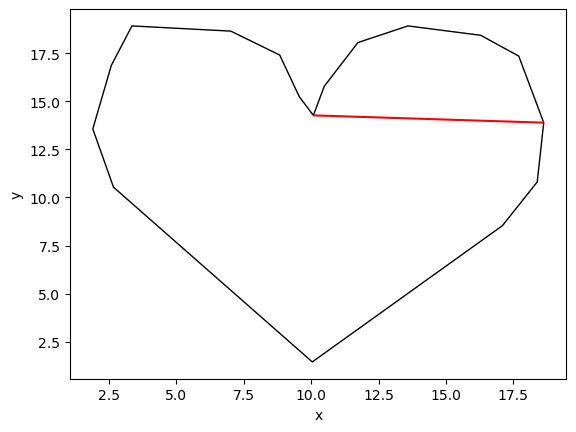

In [19]:
%matplotlib inline
drawSplitPolygon(generatedPolygon, getMonotoneSplitDiagonals(generatedPolygon))

Wielokąt testowy 1

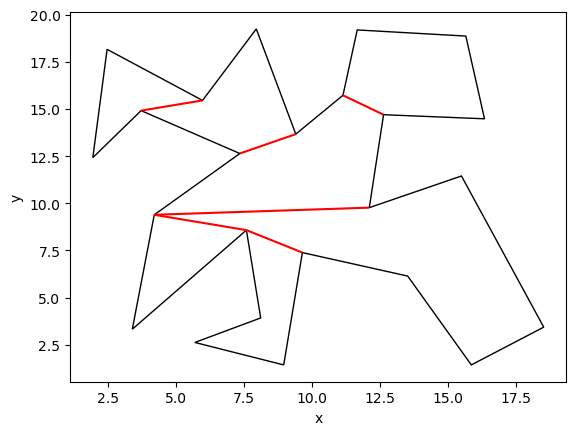

In [20]:
%matplotlib inline
drawSplitPolygon(polygon1, getMonotoneSplitDiagonals(polygon1))

Wielokąt testowy 2

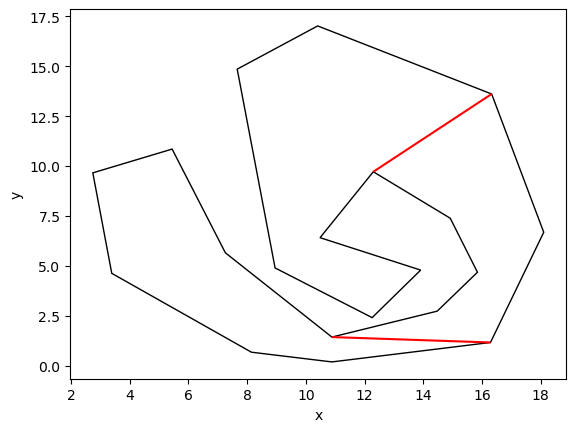

In [21]:
%matplotlib inline
drawSplitPolygon(polygon2, getMonotoneSplitDiagonals(polygon2))

Wielokąt testowy 3

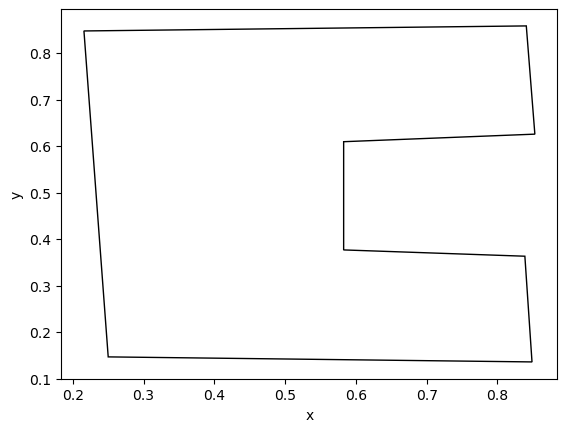

In [22]:
%matplotlib inline
drawSplitPolygon(polygon3, getMonotoneSplitDiagonals(polygon3))

<h2>Proces podziału danych wielokątów na wielokąty monotoniczne</h2>

Wielokąt wygenerowany

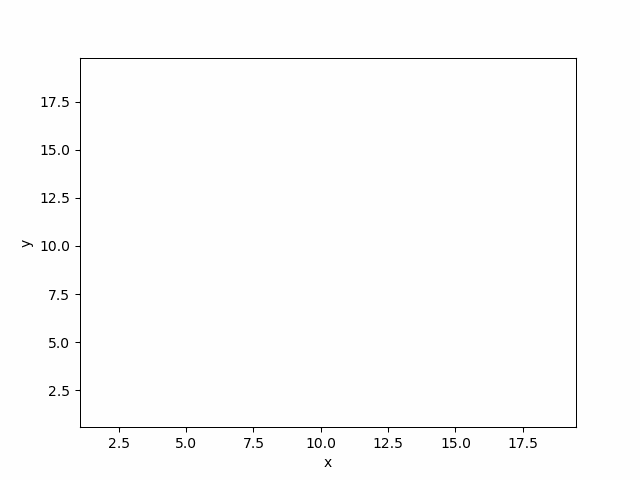

In [23]:
%matplotlib inline
_, cg = getMonotoneSplitDiagonalsDraw(generatedPolygon)
cg.show_gif()

Wielokąt testowy 1

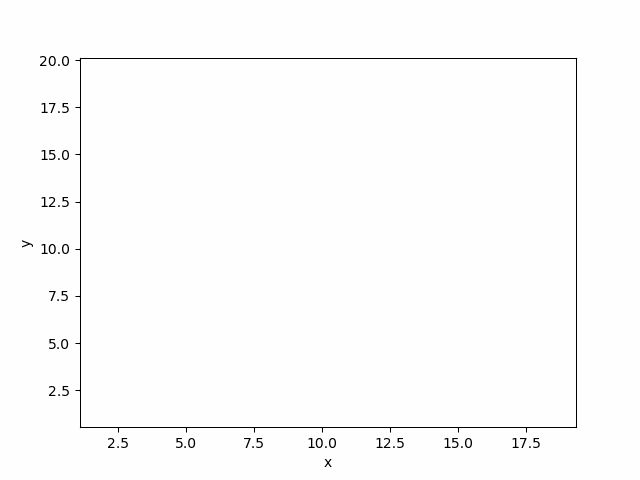

In [24]:
%matplotlib inline
_, c1 = getMonotoneSplitDiagonalsDraw(polygon1)
c1.show_gif()

Wielokąt testowy 2

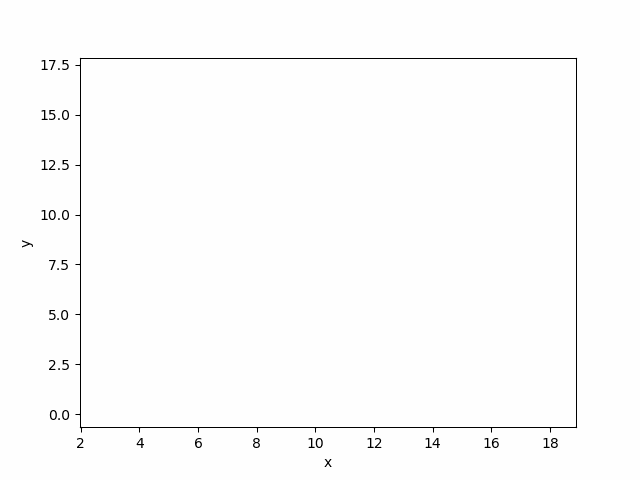

In [25]:
%matplotlib inline
_, c2 = getMonotoneSplitDiagonalsDraw(polygon2)
c2.show_gif()

Wielokąt testowy 3

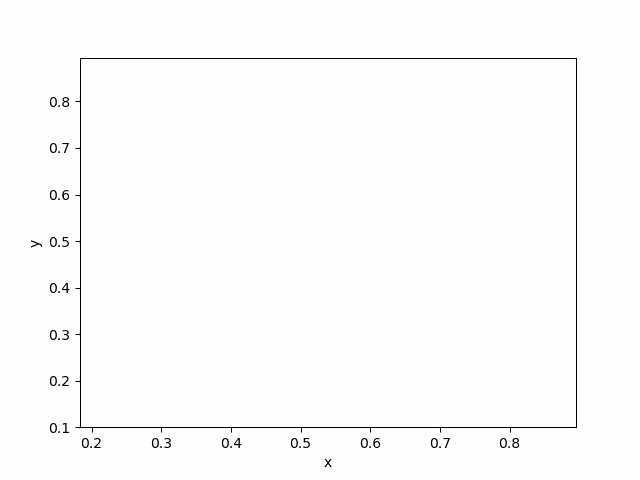

In [26]:
%matplotlib inline
_, c3 = getMonotoneSplitDiagonalsDraw(polygon3)
c3.show_gif()

# Triangulacja wielokątów

<h2>Funkcje do triangulacji wielokątów</h2>

In [27]:
# Get monotonic order of points of a polygon alongside information regarding which chain do points belong to
def getMonotonicOrder(polygon):
    monotonicOrder = []
    leftChain, rightChain = seperatePolygon(polygon)
    leftAmount = len(leftChain)
    rightAmount = len(rightChain)
    leftIndex = rightIndex = 0
    # Add points until reaching end of either chain
    while leftIndex < leftAmount and rightIndex < rightAmount:
        leftPoint = leftChain[leftIndex]
        rightPoint = rightChain[rightIndex]
        if leftPoint.y > rightPoint.y:
            monotonicOrder.append(leftPoint)
            leftIndex += 1
        else:
            monotonicOrder.append(rightPoint)
            rightIndex += 1
    # Add remaining points from the chain that did not reach it's end
    if leftIndex < leftAmount:
        monotonicOrder += leftChain[leftIndex:]
    else:
        monotonicOrder += rightChain[rightIndex:]

    return monotonicOrder

# Check if two points form and edge in the polygon
def isEdge(polygon, point1, point2):
    return abs(point1.index - point2.index) in (1, len(polygon) - 1)

# Add diagonal if points don't form an edge in polygon
# returns true if diagonal was added, false otherwise
def addDiagonal(diagonals, polygon, point1, point2):
    if not isEdge(polygon, point1, point2):
        diagonals.append((point1.index, point2.index))
        return True
    return False

# Check if triangle is inside the polygon
def isInside(p1, p2, p3):
    return det(p1.point(), p2.point(), p3.point()) * p3.chain > 0

# Get triangulation of a y-monotonic polygon
def triangulation(polygon):
    monotonicOrder = getMonotonicOrder(polygon)
    diagonals = []
    stack = [monotonicOrder[0], monotonicOrder[1]]
    for point in monotonicOrder[2:]:
        top = stack[-1]
        if point.chain != top.chain:
            while len(stack) > 0:
                p = stack.pop()
                addDiagonal(diagonals, polygon, p, point)
            stack = [top, point]
        else:
            while len(stack) > 1:
                # Break out of the loop if triangle is outside of the polygon
                if not isInside(stack[-2], stack[-1], point):
                    break
                addDiagonal(diagonals, polygon, stack[-2], point)
                stack.pop()
            stack.append(point)
    return diagonals

# Draw point ain the stack
def drawStackPoint(canvas, point):
    if type(point) is list:
        canvas.add_point([p.point() for p in point], color="green")
    else:
        canvas.add_point(point.point(), color="green")

# Draw processed point
def drawProcessedPoint(canvas, point):
    if type(point) is list:
        canvas.add_point([p.point() for p in point], color="turquoise")
    else:
        canvas.add_point(point.point(), color="turquoise")

# Draw current point
def drawCurrentPoint(canvas, point):
    canvas.add_point(point.point(), color="purple")

# Draw triangle
def drawPotentialDiagonal(canvas, point1, point2):
    return canvas.add_line_segment((point1.point(), point2.point()), color="blue")

# Draw diagonal
def drawDiagonal(canvas, point1, point2):
    canvas.add_line_segment((point1.point(), point2.point()), color="red")

# Get triangulation of a y-monotonic polygon and canvas containing steps of it
def triangulationDraw(polygon, canvas=None):
    if canvas is None:
        canvas = Visualizer()
    canvas.add_polygon(polygon, fill=False)
    monotonicOrder = getMonotonicOrder(polygon)
    diagonals = []
    stack = [monotonicOrder[0], monotonicOrder[1]]
    drawStackPoint(canvas, stack)
    for point in monotonicOrder[2:]:
        drawCurrentPoint(canvas, point)
        if point.chain != stack[-1].chain:
            for i in range(len(stack)-1, 0, -1):
                top = stack[i]
                nextToTop = stack[i-1]
                potentialDiagonal = drawPotentialDiagonal(canvas, top, point)
                if addDiagonal(diagonals, polygon, top, point):
                    drawDiagonal(canvas, top, point)
                else:
                    canvas.remove_figure(potentialDiagonal)
            drawProcessedPoint(canvas, stack[:-1])
            stack = [stack[-1], point]
        else:
            while len(stack) > 1:
                potentialDiagonal = drawPotentialDiagonal(canvas, stack[-2], point)
                # Break out of the loop if triangle is outside of the polygon
                if not isInside(stack[-2], stack[-1], point):
                    canvas.remove_figure(potentialDiagonal)
                    break
                if addDiagonal(diagonals, polygon, stack[-2], point):
                    drawDiagonal(canvas, stack[-2], point)
                else:
                    canvas.remove_figure(potentialDiagonal)
                drawProcessedPoint(canvas, stack[-1])
                stack.pop()
            stack.append(point)
        drawStackPoint(canvas, stack)
    drawProcessedPoint(canvas, stack)
    return diagonals, canvas

# Extends triangulation by adding edges
def getFullTriangulation(polygon, splittingDiagonals, triDiagonals):
    tri = []
    n = len(polygon)
    for i in range(n):
        tri.append((i, (i+1)%n))
    tri.extend(splittingDiagonals)
    tri.extend(triDiagonals)
    return polygon, tri

# Print triangulation
def printTriangulation(tri):
    polygon = tri[0]
    diagonals = tri[1]
    print("Punkty:")
    for i, point in enumerate(polygon):
        print(f"\t{i}: {pointToString(point)}")
    print("Pełna triangulacja (indeksy punktów):")
    for diagonal in diagonals:
        print(f"\t{diagonal[0]} {diagonal[1]}")

# Draws polygon with the triangulation
def drawTriangulation(tri):
    polygon = tri[0]
    diagonals = [(polygon[i], polygon[j]) for i, j in tri[1] if abs(i-j) not in (1, len(polygon)-1)]
    canvas = Visualizer()
    canvas.add_polygon(polygon, fill=False)
    canvas.add_line_segment(diagonals, color="red")
    canvas.add_point(polygon)
    canvas.show()

# Get triangulation of any polygon
def triangulatePolygon(polygon):
    splittingDiagonals = getMonotoneSplitDiagonals(polygon)
    monotonePolygons, origIndices = splitPolygonIntoMonotonePolygons(polygon, splittingDiagonals)
    triangulationDiagonals = []
    for i in range(len(monotonePolygons)):
        poly = monotonePolygons[i]
        origInd = origIndices[i]
        tri = triangulation(poly)
        triangulationDiagonals.extend([(origInd[j], origInd[k]) for j, k in tri])
    return getFullTriangulation(polygon, splittingDiagonals, triangulationDiagonals)

# Get triangulation of any polygon with the entire process
def triangulatePolygonDraw(polygon, onlyTrig=False):
    splittingDiagonals, canvas = getMonotoneSplitDiagonalsDraw(polygon)
    if onlyTrig:
        canvas.clear()
        canvas.add_polygon(polygon, fill=False)
        canvas.add_line_segment([(polygon[i], polygon[j]) for i, j in splittingDiagonals], color="red")
    monotonePolygons, origIndices = splitPolygonIntoMonotonePolygons(polygon, splittingDiagonals)
    triangulationDiagonals = []
    for i in range(len(monotonePolygons)):
        poly = monotonePolygons[i]
        origInd = origIndices[i]
        tri, canvas = triangulationDraw(poly, canvas)
        triangulationDiagonals.extend([(origInd[j], origInd[k]) for j, k in tri])
    return getFullTriangulation(polygon, splittingDiagonals, triangulationDiagonals), canvas

# Draws gif from canvas
def drawGif(canvas, interval=200):
    if canvas is not None:
        display(canvas.show_gif(interval=interval))

<h2>Triangulacja dla danych wielokątów</h2>

Wielokąt wygenerowany

Punkty:
	0: (10.040,1.446)
	1: (17.097,8.534)
	2: (18.387,10.807)
	3: (18.629,13.892)
	4: (17.702,17.355)
	5: (16.290,18.437)
	6: (13.589,18.924)
	7: (11.734,18.058)
	8: (10.484,15.785)
	9: (10.081,14.270)
	10: (9.556,15.244)
	11: (8.831,17.409)
	12: (7.016,18.653)
	13: (3.347,18.924)
	14: (2.581,16.868)
	15: (1.895,13.567)
	16: (2.661,10.537)
Pełna triangulacja (indeksy punktów):
	0 1
	1 2
	2 3
	3 4
	4 5
	5 6
	6 7
	7 8
	8 9
	9 10
	10 11
	11 12
	12 13
	13 14
	14 15
	15 16
	16 0
	3 9
	13 11
	11 14
	14 10
	14 9
	3 15
	9 15
	15 2
	2 16
	16 1
	5 7
	7 4
	4 8
	4 9


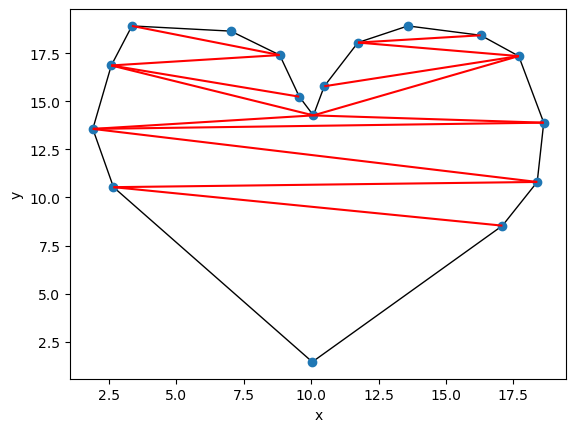

In [28]:
%matplotlib inline
generatedPolygonTriangulation = triangulatePolygon(generatedPolygon)
printTriangulation(generatedPolygonTriangulation)
drawTriangulation(generatedPolygonTriangulation)

Wielokąt testowy 1

Punkty:
	0: (9.395,13.665)
	1: (7.944,19.239)
	2: (5.968,15.451)
	3: (2.460,18.156)
	4: (1.935,12.420)
	5: (3.710,14.910)
	6: (7.339,12.637)
	7: (4.194,9.390)
	8: (3.387,3.329)
	9: (7.581,8.578)
	10: (8.105,3.925)
	11: (5.685,2.626)
	12: (8.952,1.436)
	13: (9.637,7.388)
	14: (13.508,6.143)
	15: (15.847,1.436)
	16: (18.508,3.438)
	17: (15.484,11.446)
	18: (12.097,9.769)
	19: (12.621,14.693)
	20: (16.331,14.477)
	21: (15.645,18.860)
	22: (11.653,19.184)
	23: (11.129,15.721)
Pełna triangulacja (indeksy punktów):
	0 1
	1 2
	2 3
	3 4
	4 5
	5 6
	6 7
	7 8
	8 9
	9 10
	10 11
	11 12
	12 13
	13 14
	14 15
	15 16
	16 17
	17 18
	18 19
	19 20
	20 21
	21 22
	22 23
	23 0
	5 2
	19 23
	6 0
	7 18
	9 7
	13 9
	19 0
	19 6
	6 18
	5 0
	2 0
	3 5
	18 9
	18 13
	17 13
	17 14
	14 16
	13 10
	10 12
	21 23
	21 19


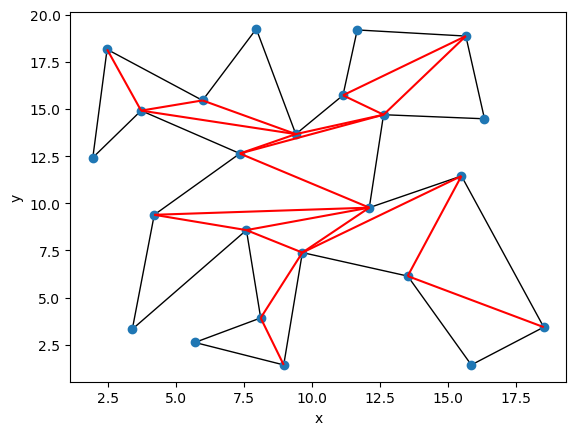

In [29]:
%matplotlib inline
triangulation1 = triangulatePolygon(polygon1)
printTriangulation(triangulation1)
drawTriangulation(triangulation1)

Wielokąt testowy 2

Punkty:
	0: (8.952,4.899)
	1: (12.258,2.410)
	2: (13.911,4.790)
	3: (10.484,6.414)
	4: (12.298,9.715)
	5: (14.919,7.388)
	6: (15.847,4.682)
	7: (14.476,2.734)
	8: (10.887,1.436)
	9: (7.258,5.656)
	10: (5.444,10.851)
	11: (2.742,9.661)
	12: (3.387,4.628)
	13: (8.145,0.678)
	14: (10.887,0.191)
	15: (16.290,1.165)
	16: (18.105,6.684)
	17: (16.331,13.611)
	18: (10.403,17.020)
	19: (7.661,14.855)
Pełna triangulacja (indeksy punktów):
	0 1
	1 2
	2 3
	3 4
	4 5
	5 6
	6 7
	7 8
	8 9
	9 10
	10 11
	11 12
	12 13
	13 14
	14 15
	15 16
	16 17
	17 18
	18 19
	19 0
	4 17
	15 8
	19 17
	19 4
	19 3
	3 0
	0 2
	17 5
	5 16
	16 6
	16 7
	7 15
	11 9
	9 12
	12 8
	15 13
	8 13


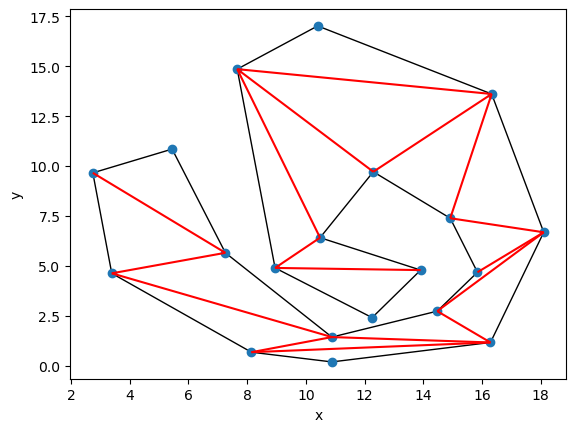

In [30]:
%matplotlib inline
triangulation2 = triangulatePolygon(polygon2)
printTriangulation(triangulation2)
drawTriangulation(triangulation2)

Wielokąt testowy 3

Punkty:
	0: (0.250,0.147)
	1: (0.849,0.136)
	2: (0.839,0.363)
	3: (0.583,0.377)
	4: (0.583,0.609)
	5: (0.853,0.626)
	6: (0.841,0.858)
	7: (0.216,0.847)
Pełna triangulacja (indeksy punktów):
	0 1
	1 2
	2 3
	3 4
	4 5
	5 6
	6 7
	7 0
	7 5
	7 4
	7 3
	2 0
	3 0


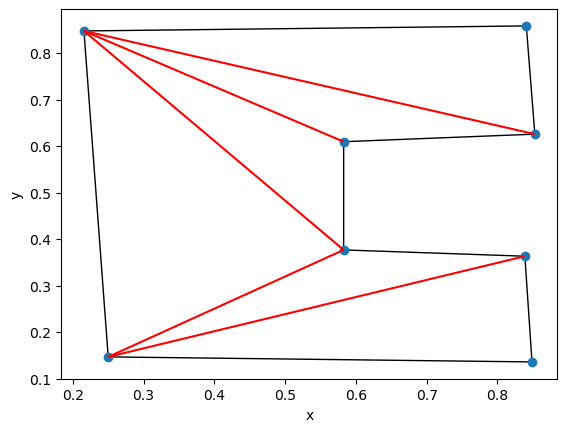

In [31]:
%matplotlib inline
triangulation3 = triangulatePolygon(polygon3)
printTriangulation(triangulation3)
drawTriangulation(triangulation3)

<h2>Przedstawienie procesu działania algorytmu triangulacji</h2>

Przedstawimy proces działania algorytmu w postaci gifa. Użyte kolory oznaczają:
<ul>
    <li style="color:green">Wierzchołek na stosie</li>
    <li style="color:purple">Wierzchołek właśnie rozpatrywany</li>
    <li style="color:turquoise">Wierzchołek przetworzony</li>
    <li style="color:blue">Potencjalna przekątna</li>
    <li style="color:red">Ostateczna przekątna w triangulacji</li>
</ul>

Wielokąt wygenerowany - cały proces

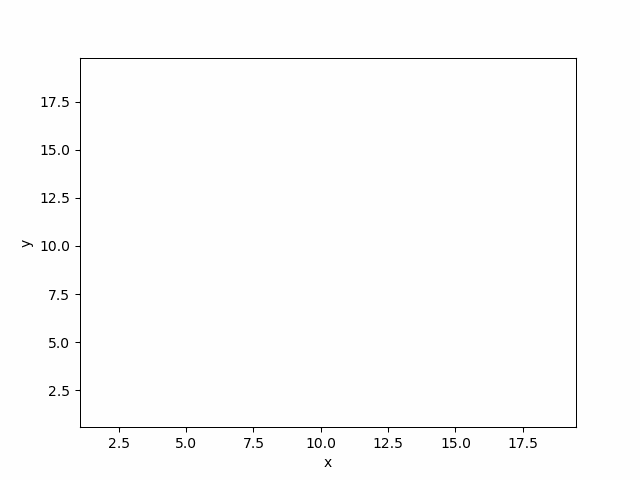

In [32]:
%matplotlib inline
_, canvasGenerated = triangulatePolygonDraw(generatedPolygon)
drawGif(canvasGenerated)

Wielokąt wygenerowany - sama triangulacja

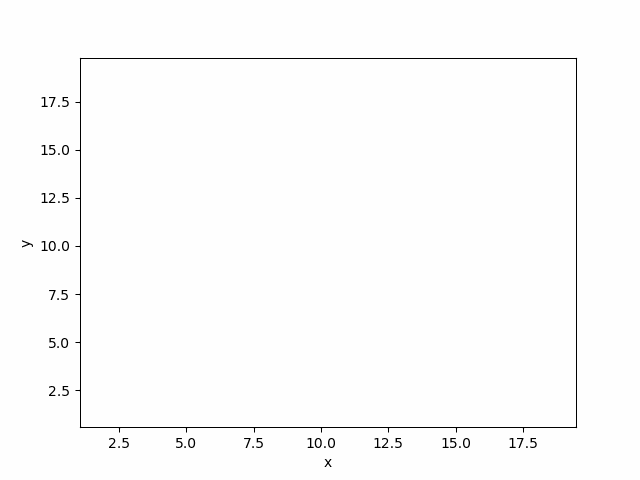

In [33]:
%matplotlib inline
_, canvasGeneratedTriOnly = triangulatePolygonDraw(generatedPolygon, True)
drawGif(canvasGeneratedTriOnly)

Wielokąt testowy 1 - cały proces

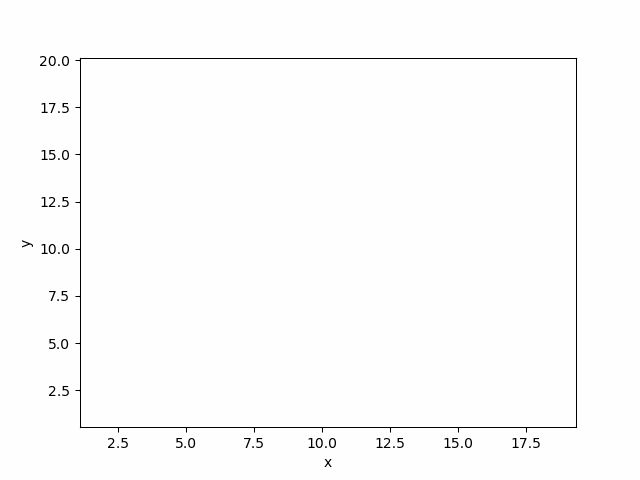

In [34]:
%matplotlib inline
_, canvas1 = triangulatePolygonDraw(polygon1)
drawGif(canvas1)

Wielokąt testowy 1 - sama triangulacja

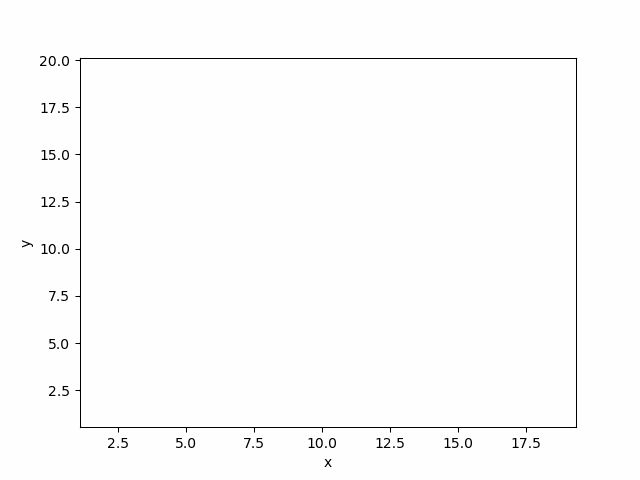

In [35]:
%matplotlib inline
_, canvas1triOnly = triangulatePolygonDraw(polygon1, True)
drawGif(canvas1triOnly)

Wielokąt testowy 2 - cały proces

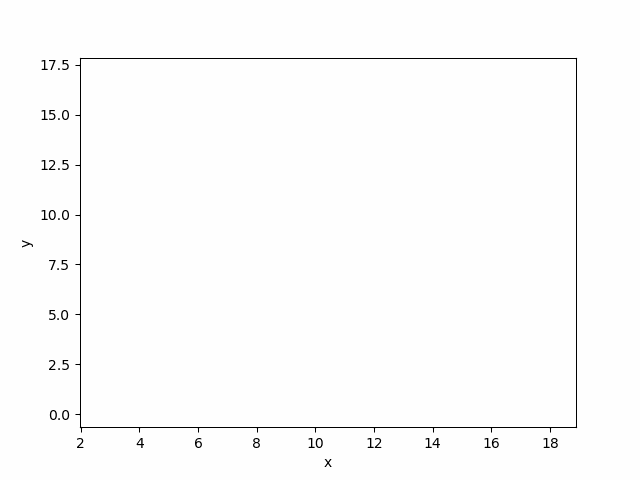

In [36]:
%matplotlib inline
_, canvas2 = triangulatePolygonDraw(polygon2)
drawGif(canvas2)

Wielokąt testowy 2 - sama triangulacja

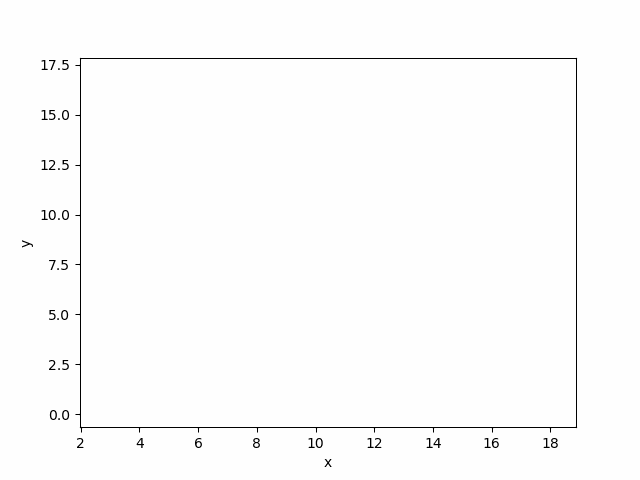

In [37]:
%matplotlib inline
_, canvas2triOnly = triangulatePolygonDraw(polygon2, True)
drawGif(canvas2triOnly)

Wielokąt testowy 3 - cały proces

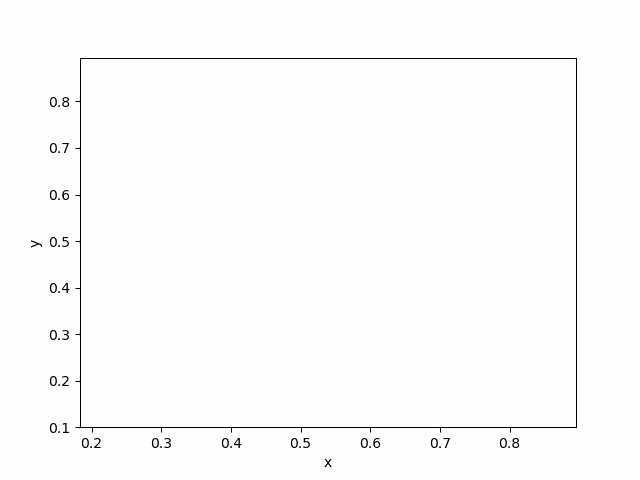

In [38]:
%matplotlib inline
_, canvas3 = triangulatePolygonDraw(polygon3)
drawGif(canvas3)

Wielokąt testowy 3 - sama triangulacja

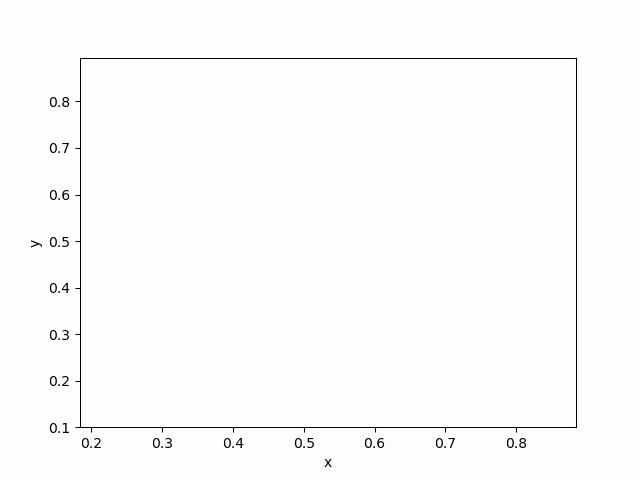

In [39]:
%matplotlib inline
_, canvas3triOnly = triangulatePolygonDraw(polygon3, True)
drawGif(canvas3triOnly)

# Test czasowy triangulacji

<h2>Funkcje do testów czasowych</h2>

In [40]:
# Point class used to generate polygon from random vertices
class Point3:
    def __init__(self, x, y):
        self.x = x
        self.y = y
        self.angle = self.calculateAngle()
        self.r = x ** 2 + y ** 2

    def calculateAngle(self):
        angle = np.arccos(cosDP((0,0), (0,1), self.point()))
        if det((0,0), (0,1), self.point()) >= 0:
            return angle
        else:
            return 2 * np.pi - angle

    def point(self):
        return (self.x, self.y)

# Generate a polygon of given amount of vertices
def generateRandomPolygon(vertexAmount):
    vertices = np.random.uniform(-100000, 100000, (vertexAmount, 2))
    vertices = [Point3(x, y) for x, y in vertices]
    return [p.point() for p in sorted(vertices, key=lambda p: (p.angle, p.r))]

# Time test triangulation for polygons of given amount of vertices
def timeTest(polygonVertexAmountArray):
    timeArray = []
    for vAmount in polygonVertexAmountArray:
        polygon = generateRandomPolygon(vAmount)
        t0 = time()
        triangulatePolygon(polygon)
        t1 = time() - t0
        timeArray.append(t1)
    return timeArray

# Print results of time test
def printTimeTestResults(vAmounts, times):
    for i in range(len(vAmounts)):
        v = vAmounts[i]
        t = times[i]
        print(f"{i+1}. {v} wierzchołków - {'{:.4f}'.format(t)}s")

<h2>Test czasu działania algorytmu</h2>

In [41]:
amountsOfVertices = [10000, 50000, 100000, 200000]
times = timeTest(amountsOfVertices)
printTimeTestResults(amountsOfVertices, times)

1. 10000 wierzchołków - 0.4696s
2. 50000 wierzchołków - 2.4540s
3. 100000 wierzchołków - 5.6434s
4. 200000 wierzchołków - 12.4078s
